<a href="https://colab.research.google.com/github/Dibyendu011/California-housing-price-prediction/blob/main/dog_vision2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# !tar -xf "/content/drive/path/to/annotation.tar" -C "/content/drive/path/to/dog_vision"
# !tar -xf "/content/drive/path/to/images.tar" -C "/content/drive/path/to/dog_vision"
# !tar -xf "/content/drive/path/to/dog_vision/lists.tar" -C "/content/drive/path/to/dog_vision"

In [ ]:
from scipy.io import loadmat
train_list = loadmat("/content/drive/path/to/dog_vision/train_list.mat")
test_list = loadmat("/content/drive/path/to/dog_vision/test_list.mat")
file_list = loadmat("/content/drive/path/to/dog_vision/file_list.mat")

In [ ]:
train_list.keys(), test_list.keys(), file_list.keys()

(dict_keys(['__header__', '__version__', '__globals__', 'file_list', 'annotation_list', 'labels']),
 dict_keys(['__header__', '__version__', '__globals__', 'file_list', 'annotation_list', 'labels']),
 dict_keys(['__header__', '__version__', '__globals__', 'file_list', 'annotation_list', 'labels']))

In [ ]:
 print(f"Number of files in training list: {len(train_list['file_list'])}")
 print(f"Number of files in testing list: {len(test_list['file_list'])}")
 print(f"Number of files in full list: {len(file_list['file_list'])}")

Number of files in training list: 12000
Number of files in testing list: 8580
Number of files in full list: 20580


In [ ]:
train_list["file_list"]

array([[array(['n02085620-Chihuahua/n02085620_5927.jpg'], dtype='<U38')],
       [array(['n02085620-Chihuahua/n02085620_4441.jpg'], dtype='<U38')],
       [array(['n02085620-Chihuahua/n02085620_1502.jpg'], dtype='<U38')],
       ...,
       [array(['n02116738-African_hunting_dog/n02116738_6754.jpg'], dtype='<U48')],
       [array(['n02116738-African_hunting_dog/n02116738_9333.jpg'], dtype='<U48')],
       [array(['n02116738-African_hunting_dog/n02116738_2503.jpg'], dtype='<U48')]],
      dtype=object)

In [ ]:
train_list["file_list"][0][0][0]

np.str_('n02085620-Chihuahua/n02085620_5927.jpg')

In [ ]:
train_file_list = list(item[0][0] for item in train_list["file_list"])
test_file_list = list(item[0][0] for item in test_list["file_list"])
full_file_list = list(item[0][0] for item in file_list["file_list"])

In [ ]:
len(train_file_list), len(test_file_list), len(full_file_list)

(12000, 8580, 20580)

In [ ]:
import random
random.sample(train_file_list, k=10)

[np.str_('n02112137-chow/n02112137_1704.jpg'),
 np.str_('n02107908-Appenzeller/n02107908_3254.jpg'),
 np.str_('n02097658-silky_terrier/n02097658_1154.jpg'),
 np.str_('n02102973-Irish_water_spaniel/n02102973_1622.jpg'),
 np.str_('n02113712-miniature_poodle/n02113712_3120.jpg'),
 np.str_('n02105855-Shetland_sheepdog/n02105855_1816.jpg'),
 np.str_('n02108551-Tibetan_mastiff/n02108551_240.jpg'),
 np.str_('n02104029-kuvasz/n02104029_3991.jpg'),
 np.str_('n02100735-English_setter/n02100735_4912.jpg'),
 np.str_('n02109961-Eskimo_dog/n02109961_2932.jpg')]

In [ ]:
len(set(train_file_list).intersection(test_file_list))

0

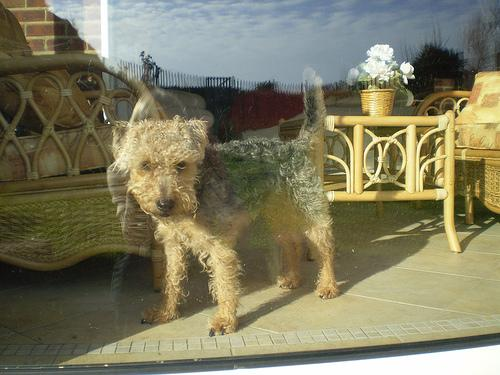

In [ ]:
from IPython.display import Image,display
import os
Image(os.path.join("/content/drive/path/to/dog_vision/Images", full_file_list[7000]))

In [ ]:
annot_folders = os.listdir("/content/drive/path/to/dog_vision/Annotation")
len(annot_folders)

120

In [ ]:
annot_dict = {}
for folder in annot_folders :
  class_name = "_".join(folder.split("-")[1:]).lower()
  annot_dict[folder] = class_name
len(annot_dict)

120

In [ ]:
list(annot_dict.items())[:5]

[('n02085620-Chihuahua', 'chihuahua'),
 ('n02085782-Japanese_spaniel', 'japanese_spaniel'),
 ('n02085936-Maltese_dog', 'maltese_dog'),
 ('n02086079-Pekinese', 'pekinese'),
 ('n02086240-Shih-Tzu', 'shih_tzu')]

In [ ]:
dog_list = sorted(list(annot_dict.values()))
dog_list[:10]

['affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle']

In [ ]:
count_dict = {}

def count_files_in_directory(path):
  file_count = 0
  for item in os.listdir(path):
    item_path = os.path.join(path, item)
    if os.path.isfile(item_path):
      file_count += 1
  return file_count

%cd /content/drive/path/to/dog_vision/Annotation

for i in range (len(annot_dict)) :
  folder_path = str(list(annot_dict.keys())[i])
  num_files = count_files_in_directory(folder_path)
  count_dict[folder_path] = num_files

/content/drive/MyDrive/Colab/dog_vision/Annotation


In [ ]:
list(count_dict.items())[:5]

[('n02085620-Chihuahua', 152),
 ('n02085782-Japanese_spaniel', 185),
 ('n02085936-Maltese_dog', 252),
 ('n02086079-Pekinese', 149),
 ('n02086240-Shih-Tzu', 214)]

In [ ]:
sum(count_dict.values())

20580

In [ ]:
dog_df = pd.DataFrame({"Breeds" : list(annot_dict.values()), "Count" : list(count_dict.values())}).sort_values(by="Count", ascending=False)
dog_df

,Breeds,Count
2,maltese_dog,252
9,afghan_hound,239
26,scottish_deerhound,232
107,pomeranian,219
88,bernese_mountain_dog,218
...,...,...
73,groenendael,150
100,affenpinscher,150
118,dhole,150
3,pekinese,149


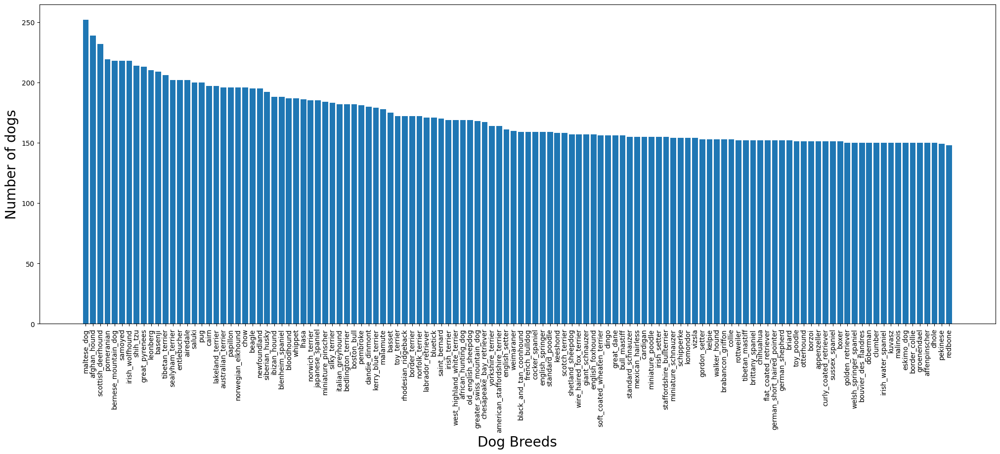

In [ ]:
import matplotlib.pyplot as plt
plt.figure(figsize=(20,7))
plt.bar(dog_df["Breeds"],dog_df["Count"])
plt.tight_layout()
plt.xlabel("Dog Breeds",fontsize=20)
plt.ylabel("Number of dogs",fontsize=20)
plt.xticks(rotation=90);

In [ ]:
dog_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 120 entries, 2 to 17
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Breeds  120 non-null    object
 1   Count   120 non-null    int64 
dtypes: int64(1), object(1)
memory usage: 2.8+ KB


In [ ]:
dog_df.describe()

,Count
count,120.000000
mean,171.500000
std,23.220898
min,148.000000
25%,152.750000
50%,159.500000
75%,186.250000
max,252.000000


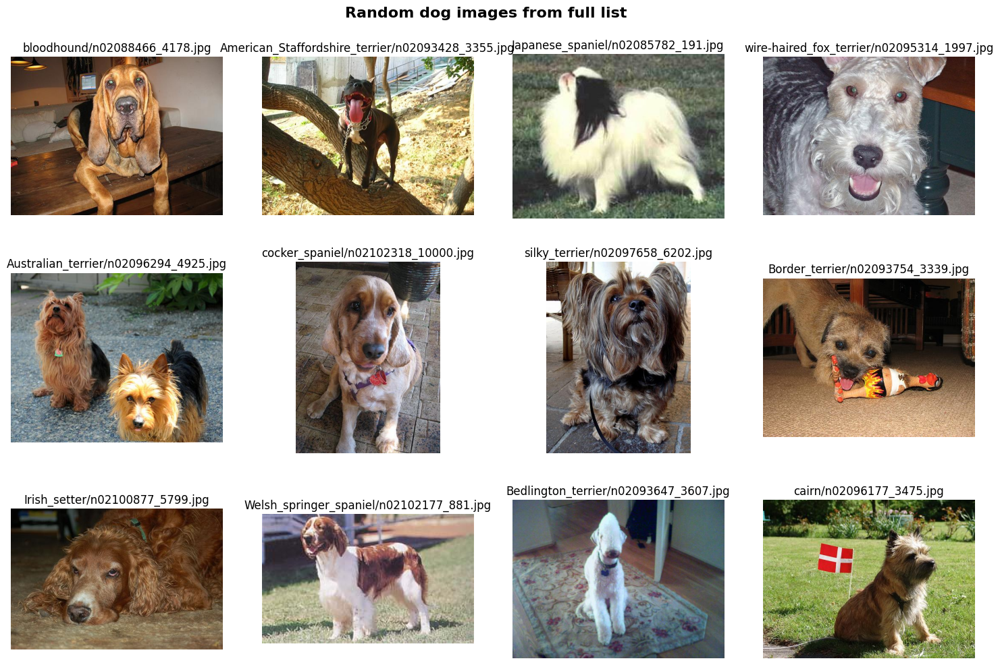

In [ ]:
from IPython.display import Image, display
n = random.sample(range(0,12000), 12)
fig, axes = plt.subplots(3, 4, figsize=(15, 10))
fig.tight_layout()
fig.suptitle("Random dog images from full list", fontsize=16, fontweight='bold', y=1.03)

for i, ax in enumerate(axes.flat) :
    img_path = os.path.join("/content/drive/path/to/dog_vision/Images", full_file_list[n[i]])
    img = plt.imread(img_path)
    ax.imshow(img)
    ax.set_title(str(full_file_list[n[i]])[10:])
    ax.axis("off")

plt.show()

In [ ]:
%cd /content/drive/path/to/dog_vision
!pwd

/content/drive/MyDrive/Colab/dog_vision
/content/drive/MyDrive/Colab/dog_vision


In [ ]:
from pathlib import Path
images_split_dir = Path("images_split")

train_dir = images_split_dir/"train"
test_dir = images_split_dir/"test"

train_dir.mkdir(parents=True, exist_ok=True)
test_dir.mkdir(parents=True, exist_ok=True)

for breeds in dog_list :
  train_class_dir = train_dir/breeds
  test_class_dir = test_dir/breeds
  train_class_dir.mkdir(parents=True, exist_ok=True)
  test_class_dir.mkdir(parents=True, exist_ok=True)

In [ ]:
print(f"No. of subfolders in train folder : {len(os.listdir('/content/drive/path/to/dog_vision/images_split/train'))}")
print(f"No. of subfolders in test folder : {len(os.listdir('/content/drive/path/to/dog_vision/images_split/test'))}")

No. of subfolders in train folder : 120
No. of subfolders in test folder : 120


In [ ]:
from shutil import copy2
from tqdm.auto import tqdm

def copy_files_to_target_dir(file_list: list[str],
                             target_dir: str,
                             images_dir: str = "Images",
                             verbose: bool = False) -> None:
    for file in tqdm(file_list) :
      source_file_path = Path(images_dir) / Path(file)
      file_class_name = annot_dict[Path(file).parts[0]]
      file_image_name = Path(file).name
      destination_file_path = Path(target_dir) / file_class_name / file_image_name
      destination_file_path.parent.mkdir(parents=True, exist_ok=True)
      copy2(src=source_file_path, dst=destination_file_path)

In [ ]:
# copy_files_to_target_dir(file_list=train_file_list, target_dir=train_dir, verbose=False)
# copy_files_to_target_dir(file_list=test_file_list, target_dir=test_dir, verbose=False)

  0%|          | 0/12000 [00:00<?, ?it/s]

  0%|          | 0/8580 [00:00<?, ?it/s]

In [ ]:
train_image_paths = list(train_dir.rglob("*.jpg"))
test_image_paths = list(test_dir.rglob("*.jpg"))

assert len(train_image_paths) == len(train_file_list)
assert len(test_image_paths) == len(test_file_list)

print(f"Number of images in {train_dir}: {len(train_image_paths)}")
print(f"Number of images in {test_dir}: {len(test_image_paths)}")

Number of images in images_split/train: 12000
Number of images in images_split/test: 8580


In [ ]:
import tensorflow as tf
train_ds = tf.keras.preprocessing.image_dataset_from_directory(directory="/content/drive/path/to/dog_vision/images_split/train",
                                                               batch_size=10,
                                                               image_size=(224, 224),
                                                               shuffle=True,
                                                               label_mode="categorical",
                                                               seed=42)
test_ds = tf.keras.preprocessing.image_dataset_from_directory(directory="/content/drive/path/to/dog_vision/images_split/test",
                                                               batch_size=10,
                                                               image_size=(224, 224),
                                                               shuffle=False,
                                                               label_mode="categorical")

Found 12000 files belonging to 120 classes.
Found 8580 files belonging to 120 classes.


In [ ]:
train_ds, test_ds

(<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))>,
 <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.float32, name=None))>)

In [ ]:
image_batch, label_batch = next(iter(train_ds))
image_batch_2, label_batch_2 = next(iter(train_ds))
image_batch.shape, label_batch.shape

(TensorShape([10, 224, 224, 3]), TensorShape([10, 120]))

In [ ]:
image_batch[0]

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[143.13617 , 145.81027 , 144.81027 ],
        [ 85.62561 ,  94.659096,  91.647934],
        [ 51.457584,  68.939735,  61.51339 ],
        ...,
        [ 25.629517,  54.629517,  52.629517],
        [ 25.022278,  54.022278,  52.022278],
        [ 24.479399,  53.4794  ,  51.4794  ]],

       [[140.85938 , 145.53348 , 144.19643 ],
        [ 81.06881 ,  91.356   ,  87.71799 ],
        [ 47.194195,  62.620537,  55.879463],
        ...,
        [ 27.314758,  53.31476 ,  52.31476 ],
        [ 25.39541 ,  51.395412,  50.395412],
        [ 24.029036,  50.029037,  49.029037]],

       [[139.28839 , 148.22545 , 145.16518 ],
        [ 77.0491  ,  88.80888 ,  84.79773 ],
        [ 40.53125 ,  56.901787,  49.84598 ],
        ...,
        [ 27.772362,  51.77236 ,  51.77236 ],
        [ 24.310204,  48.310204,  48.310204],
        [ 21.553572,  45.553574,  45.553574]],

       ...,

       [[ 44.51719 ,  26.928303,  32.09801 ],
        [ 37.

In [ ]:
label_batch[0]

<tf.Tensor: shape=(120,), dtype=float32, numpy=
array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0.], dtype=float32)>

In [ ]:
dog_list[tf.argmax(label_batch[0])]

'scottish_deerhound'

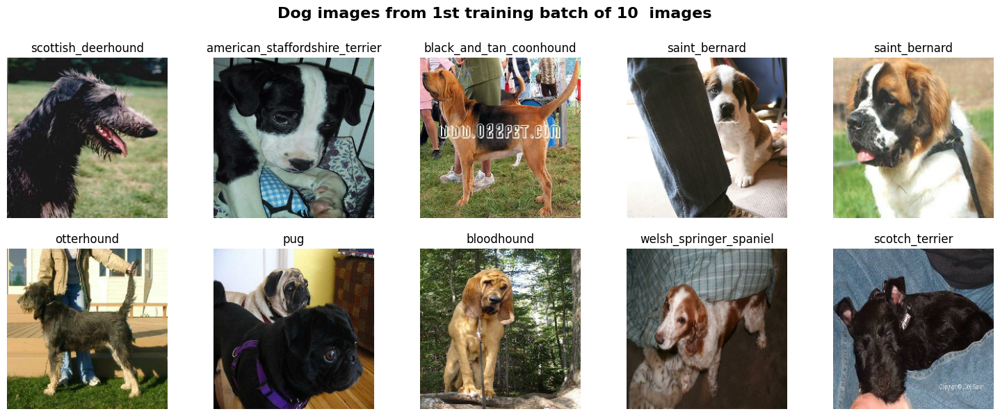

In [ ]:
n = random.sample(range(0,10), 10)
fig, axes = plt.subplots(2,5, figsize=(15, 6))
fig.suptitle("Dog images from 1st training batch of 10  images", fontsize=16, fontweight='bold', y=1.03)
fig.tight_layout()

for i, ax in enumerate(axes.flat) :
    ax.imshow(image_batch[n[i]].numpy().astype("uint8"))
    ax.set_title(dog_list[tf.argmax(label_batch[n[i]])])
    ax.axis("off")
plt.show()

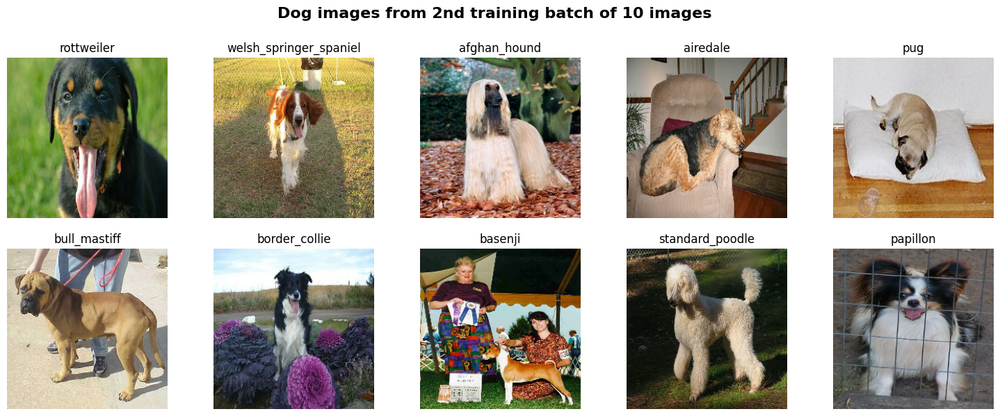

In [ ]:
fig, axes = plt.subplots(2, 5, figsize=(15, 6))
fig.suptitle("Dog images from 2nd training batch of 10 images", fontsize=16, fontweight='bold', y=1.03)
fig.tight_layout()

for i, ax in enumerate(axes.flat) :
    ax.imshow(image_batch_2[n[i]].numpy().astype("uint8"))
    ax.set_title(dog_list[tf.argmax(label_batch_2[n[i]])])
    ax.axis("off")
plt.show()

In [ ]:
assert set(train_ds.class_names) == set(test_ds.class_names)
train_ds.file_paths[:5]

['/content/drive/MyDrive/Colab/dog_vision/images_split/train/boston_bull/n02096585_1753.jpg',
 '/content/drive/MyDrive/Colab/dog_vision/images_split/train/kerry_blue_terrier/n02093859_855.jpg',
 '/content/drive/MyDrive/Colab/dog_vision/images_split/train/border_terrier/n02093754_2281.jpg',
 '/content/drive/MyDrive/Colab/dog_vision/images_split/train/rottweiler/n02106550_11823.jpg',
 '/content/drive/MyDrive/Colab/dog_vision/images_split/train/airedale/n02096051_5884.jpg']

In [ ]:
from tensorflow.data.experimental import AUTOTUNE
train_new = train_ds.cache().shuffle(buffer_size=1000).prefetch(buffer_size=tf.data.AUTOTUNE)
test_new = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
# uncomment & run to train the model on 10% of the training dataset

train_10_percent_dir = images_split_dir / "train_10_percent"
train_10_percent_dir.mkdir(parents=True, exist_ok=True)

# random.seed(42)
# train_image_paths_random_10_percent = random.sample(population=train_image_paths,
                                                    # k=int(0.1*len(train_image_paths)))
# print(f"Original number of training image paths: {len(train_image_paths)}")
# print(f"Number of 10% training image paths: {len(train_image_paths_random_10_percent)}")
# print("First 5 random 10% training image paths:")
# train_image_paths_random_10_percent[:5]

# for source_file_path in tqdm(train_image_paths_random_10_percent):
  # destination_file_and_image_name = Path(*source_file_path.parts[-2:])
  # destination_file_path = train_10_percent_dir / destination_file_and_image_name
  # target_class_dir = destination_file_path.parent
  # if not target_class_dir.is_dir():
    # target_class_dir.mkdir(parents=True,
                           # exist_ok=True)
  # copy2(src=source_file_path,
        # dst=destination_file_path)

train_10_percent_ds = tf.keras.utils.image_dataset_from_directory(directory=train_10_percent_dir,
                                                                  label_mode="categorical",
                                                                  batch_size=10,
                                                                  image_size=(224,224),
                                                                  shuffle=True,
                                                                  seed=42)

train_10_percent_ds = train_10_percent_ds.cache().shuffle(buffer_size=10*10).prefetch(buffer_size=AUTOTUNE)

Found 1200 files belonging to 120 classes.


In [ ]:
inputs = tf.keras.layers.Input(shape=(224,224,3), name="input_layer")

base_model = tf.keras.applications.efficientnet_v2.EfficientNetV2B0(include_top=False,
                                                                    weights="imagenet",
                                                                    input_shape=(224,224,3),
                                                                    pooling="avg",
                                                                    include_preprocessing=True,)
base_model.trainable = False

x = base_model(inputs, training=False)

output_layer = tf.keras.layers.Dense(activation = "softmax",
                                     units = len(dog_list),
                                     name = "output_layer")(x)

model = tf.keras.Model(inputs=inputs,
                       outputs=output_layer,
                       name = "model")

model.compile(optimizer="adam",
              loss="categorical_crossentropy",
              metrics=["accuracy"])

24274472/24274472 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
model.summary()

Model: "model"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b0 (Functional)  │ (None, 1280)           │     5,919,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ output_layer (Dense)            │ (None, 120)            │       153,720 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,073,032 (23.17 MB)

 Trainable params: 153,720 (600.47 KB)

 Non-trainable params: 5,919,312 (22.58 MB)

In [ ]:
len(base_model.layers)

271

In [ ]:
%%time
# replace "train_10_percent_ds" with "train_ds" if you want to train the model on full training dataset
result = model.fit(x=train_10_percent_ds,
                   epochs=5,
                   verbose=1,
                   validation_data = test_new)

Epoch 1/5
120/120 ━━━━━━━━━━━━━━━━━━━━ 1616s 12s/step - accuracy: 0.1987 - loss: 4.1414 - val_accuracy: 0.6343 - val_loss: 2.1077
Epoch 2/5
120/120 ━━━━━━━━━━━━━━━━━━━━ 574s 5s/step - accuracy: 0.8344 - loss: 1.3432 - val_accuracy: 0.7577 - val_loss: 1.1694
Epoch 3/5
120/120 ━━━━━━━━━━━━━━━━━━━━ 573s 5s/step - accuracy: 0.9403 - loss: 0.5776 - val_accuracy: 0.7865 - val_loss: 0.8862
Epoch 4/5
120/120 ━━━━━━━━━━━━━━━━━━━━ 624s 5s/step - accuracy: 0.9685 - loss: 0.3576 - val_accuracy: 0.8002 - val_loss: 0.7680
Epoch 5/5
120/120 ━━━━━━━━━━━━━━━━━━━━ 620s 5s/step - accuracy: 0.9866 - loss: 0.2386 - val_accuracy: 0.8063 - val_loss: 0.7086
CPU times: user 1h 15min 1s, sys: 1min 16s, total: 1h 16min 18s
Wall time: 1h 6min 46s


In [ ]:
!pwd
import pickle
model.save("dog_model.keras")
with open ("model_history.pkl", "wb") as file :
  pickle.dump(result.history, file)

/content/drive/MyDrive/Colab/dog_vision


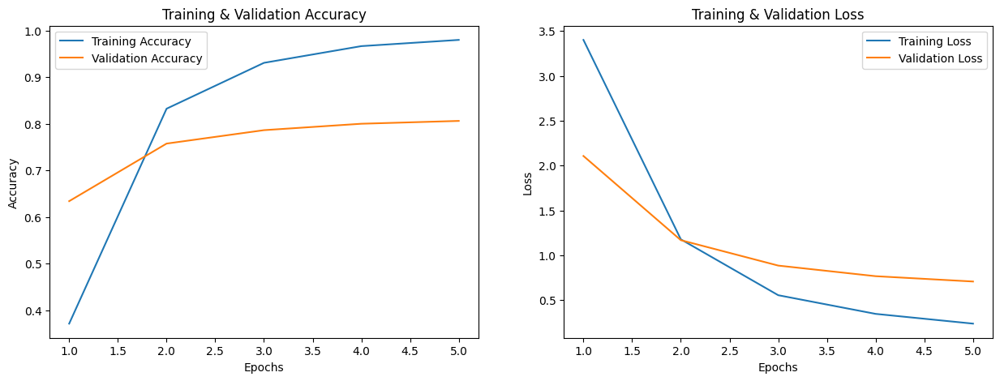

In [ ]:
history = result.history

plt.figure(figsize=(15,5))

plt.subplot(1,2,1)
plt.plot(np.arange(1,6), history["accuracy"],label="Training Accuracy")
plt.plot(np.arange(1,6), history["val_accuracy"],label="Validation Accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()
plt.title("Training & Validation Accuracy")

plt.subplot(1,2,2)
plt.plot(np.arange(1,6), history["loss"],label="Training Loss")
plt.plot(np.arange(1,6), history["val_loss"],label="Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.title("Training & Validation Loss")

plt.show()

In [ ]:
%cd /content/drive/path/to/dog_vision
from tensorflow import keras
loaded_model = keras.models.load_model("dog_model.keras")

/content/drive/MyDrive/Colab/dog_vision


In [ ]:
%%time
%cd /content/drive/path/to/dog_vision
pred_probs = loaded_model.predict(test_new.take(500), verbose=False)

CPU times: user 7min 53s, sys: 15.2 s, total: 8min 8s
Wall time: 5min 16s


In [ ]:
pred_probs

array([[8.0550385e-01, 1.9501940e-04, 4.6446974e-05, ..., 1.0578599e-04,
        3.4957434e-04, 2.7074693e-03],
       [6.0087907e-01, 1.9722781e-04, 7.2712326e-05, ..., 1.2816343e-04,
        1.0228385e-03, 4.2193723e-03],
       [7.8507531e-01, 2.0376765e-04, 7.7220386e-05, ..., 9.1031157e-05,
        1.1093229e-03, 4.6874760e-03],
       ...,
       [1.6296169e-04, 3.7408178e-04, 1.5108881e-03, ..., 1.0778535e-03,
        3.4517833e-04, 2.7863297e-04],
       [5.0890827e-05, 2.6571585e-04, 2.8384652e-04, ..., 6.1835308e-04,
        4.4517283e-04, 1.3572427e-04],
       [1.1138135e-04, 3.7916869e-04, 8.8934100e-04, ..., 5.0257711e-04,
        2.2100964e-04, 5.5505283e-04]], dtype=float32)

In [ ]:
pred_probs.shape

(5000, 120)

In [ ]:
# uncomment & run to get predictions for entire "test_ds" test dataset
# test_ds_images = np.concatenate([images for images, labels in test_ds], axis=0)
# test_ds_labels = np.concatenate([labels for images, labels in test_ds], axis=0)

# len(test_ds_images), len(test_ds_labels)

In [ ]:
import random
import matplotlib.pyplot as plt
images = []
labels = []
for image_batch, label_batch in test_new.take(500): # taking only 500 batches for faster prediction, entire training dataset can be passed
    images.append(image_batch)
    labels.append(label_batch)

images = tf.concat(images, axis=0)
labels = tf.concat(labels, axis=0)

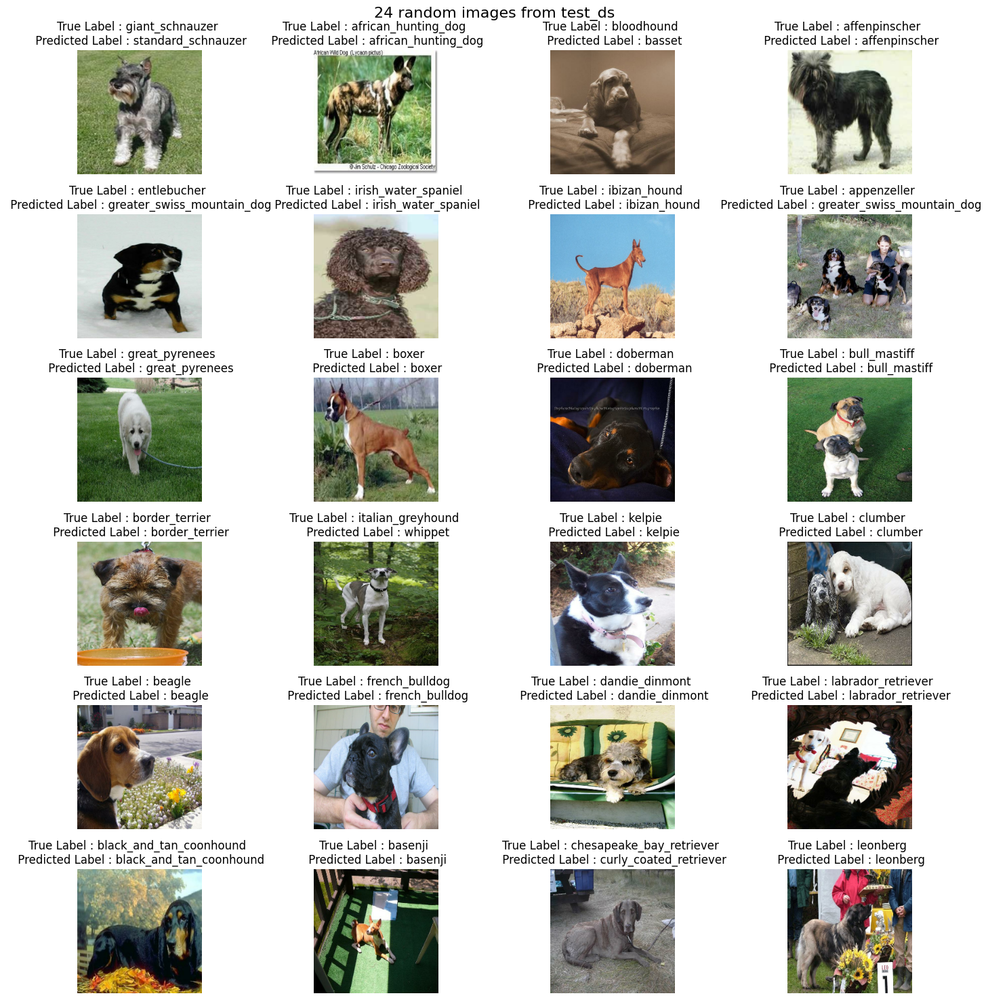

In [ ]:
random_indices = np.arange(10,5000,208)
random.shuffle(random_indices[:24])

fig, axes = plt.subplots(6,4, figsize=(15, 15))
fig.suptitle("24 random images from test_ds", fontsize=16)

for i, ax in enumerate(axes.flat):
    img = images[random_indices[i]].numpy().astype("uint8")
    label = labels[random_indices[i]].numpy()
    class_index = dog_list[np.argmax(label)]

    ax.imshow(img)
    ax.set_title(f"True Label : {class_index} \n Predicted Label : {dog_list[tf.argmax(pred_probs[random_indices[i]])]}")
    ax.axis("off")

plt.tight_layout()
plt.show()

In [ ]:
pred_list = []
for i in range (5000) :
  pred_list.append(dog_list[tf.argmax(pred_probs[i])])

In [ ]:
true_list = []
class_names = test_ds.class_names
sampled_ds = test_ds.take(500)
for images, labels in sampled_ds:
  for i in range (10) :
    label = class_names[tf.argmax(labels[i]).numpy()]
    true_list.append(label)

In [ ]:
prob_list = []
for i in range (5000) :
  prob_list.append(np.max(pred_probs[i]))

In [ ]:
bool_list = []
for i in range (5000) :
  bool_list.append(pred_list[i]==true_list[i])

In [ ]:
test_result = pd.DataFrame({"True Labels" : true_list,
                            "Pred Labels" : pred_list,
                            "Pred Prob" : prob_list,
                            "Correct" : bool_list})

In [ ]:
test_result

,True Labels,Pred Labels,Pred Prob,Correct
0,affenpinscher,affenpinscher,0.805504,True
1,affenpinscher,affenpinscher,0.600879,True
2,affenpinscher,affenpinscher,0.785075,True
3,affenpinscher,affenpinscher,0.341148,True
4,affenpinscher,affenpinscher,0.889737,True
...,...,...,...,...
4995,malamute,malamute,0.470715,True
4996,malamute,malamute,0.733308,True
4997,malamute,malamute,0.602076,True
4998,malamute,eskimo_dog,0.582315,False


In [ ]:
accuracy_per_class = test_result.groupby("True Labels")["Correct"].mean()
accuracy_per_class_df = pd.DataFrame(accuracy_per_class).reset_index().sort_values("Correct", ascending=False)
accuracy_per_class_df

,True Labels,Correct
41,english_springer,1.000000
62,keeshond,1.000000
45,french_bulldog,0.983051
20,bouvier_des_flandres,0.980000
36,dhole,0.980000
...,...,...
63,kelpie,0.509434
53,greater_swiss_mountain_dog,0.470588
60,italian_greyhound,0.426829
28,chesapeake_bay_retriever,0.417910


Text(0.5, 1.0, 'Accuracy per Class')

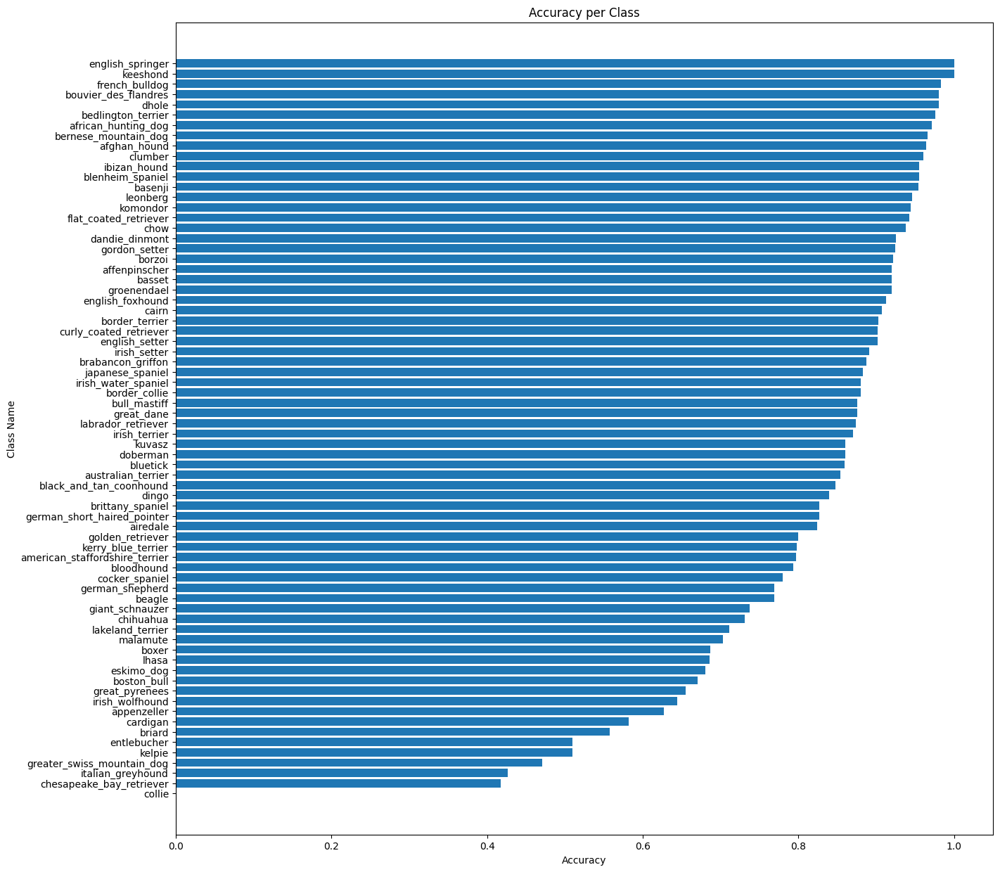

In [ ]:
plt.figure(figsize=(15,15))
plt.barh(accuracy_per_class_df["True Labels"], accuracy_per_class_df["Correct"])
plt.gca().invert_yaxis()
plt.xlabel("Accuracy")
plt.ylabel("Class Name")
plt.title("Accuracy per Class")

In [ ]:
test_result["True Labels"].value_counts().tail(30)

,count
True Labels,
bull_mastiff,56
great_dane,56
irish_setter,55
cardigan,55
komondor,54
collie,53
kelpie,53
brabancon_griffon,53
gordon_setter,53


In [ ]:
len(test_result["True Labels"].unique()), len(test_result["Pred Labels"].unique())

(72, 118)

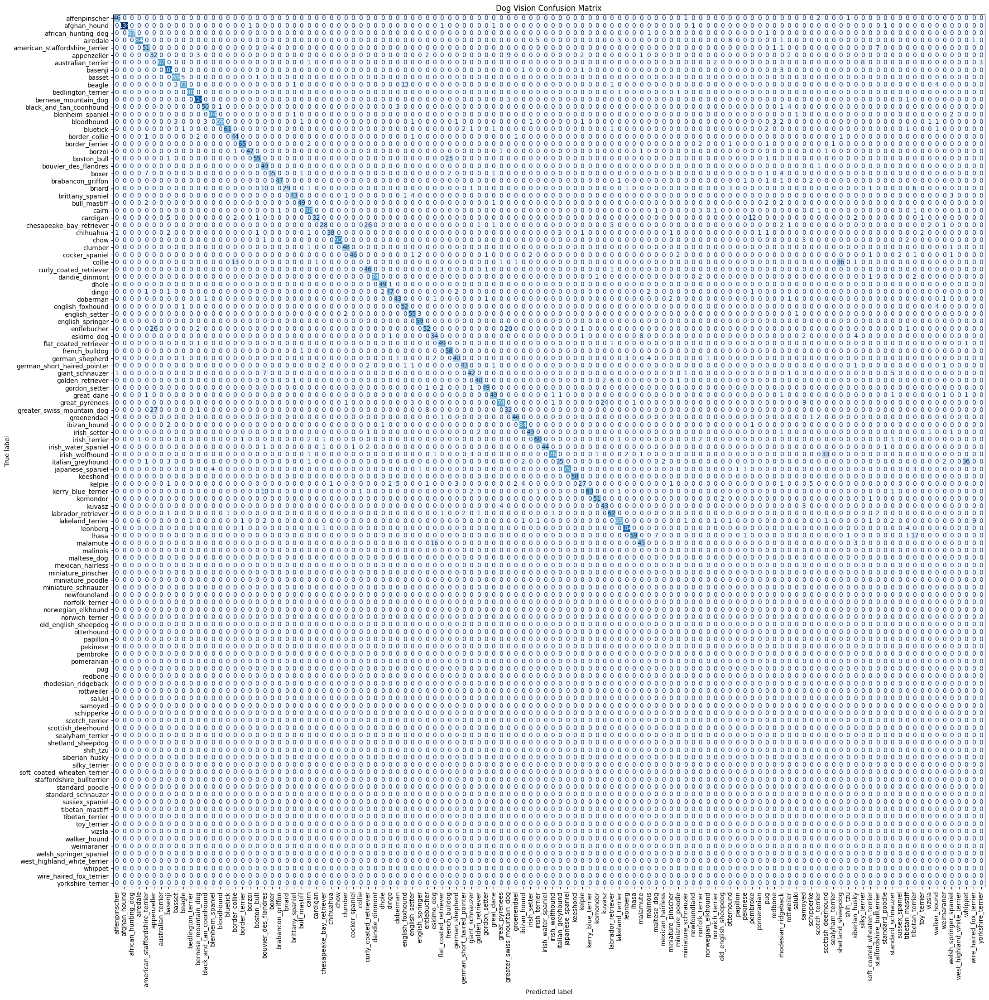

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
present_classes = sorted(list(set(true_list + pred_list)))
fig, ax = plt.subplots(figsize=(25, 25))
ax.set_title("Dog Vision Confusion Matrix")
ConfusionMatrixDisplay(confusion_matrix(true_list, pred_list),display_labels=present_classes).plot(xticks_rotation="vertical",
                                                                    cmap="Blues",
                                                                    colorbar=False,
                                                                    ax=ax);

In [ ]:
# training & predicting on whole dataset can return a proper confusion matrix

/content/drive/MyDrive/Colab/dog_vision/Custom


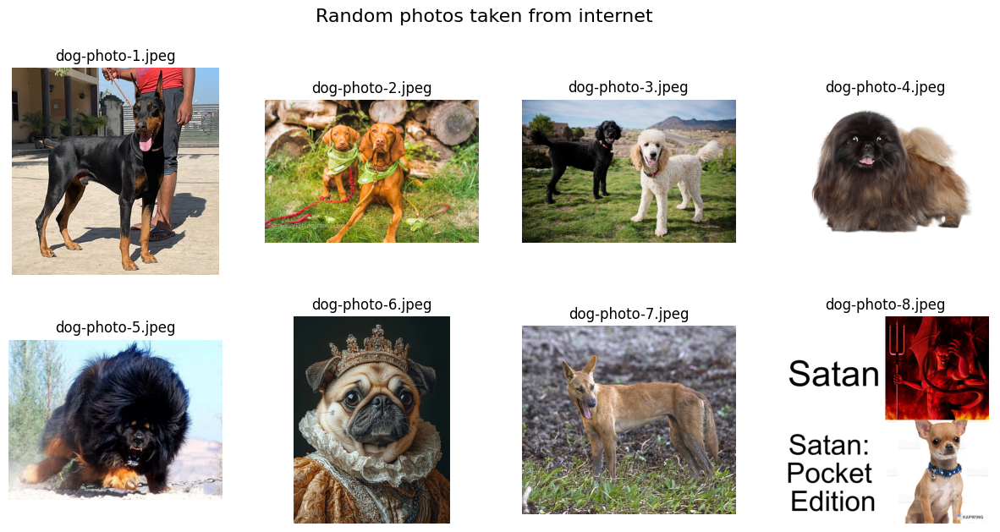

In [ ]:
import matplotlib.pyplot as plt
%cd /content/drive/path/to/dog_vision/Custom
# testing on custom images, replace file names with actual file names in your path
custom_image_paths = ["dog-photo-1.jpeg",
                      "dog-photo-2.jpeg",
                      "dog-photo-3.jpeg",
                      "dog-photo-4.jpeg",
                      "dog-photo-5.jpeg",
                      "dog-photo-6.jpeg",
                      "dog-photo-7.jpeg",
                      "dog-photo-8.jpeg"]
fig, axes = plt.subplots(2, 4, figsize=(15, 7))
fig.suptitle("Random photos taken from internet", fontsize=16)
for i, ax in enumerate(axes.flatten()):
  ax.imshow(plt.imread(custom_image_paths[i]))
  ax.axis("off")
  ax.set_title(custom_image_paths[i])

In [ ]:
import tensorflow as tf
custom_list = []
custom_prob = []
shap_list1 = []
shap_list2 = []
shap_list3 = []
shap_list4 = []
shap_list5 = []
shap_list6 = []
shap_list7 = []
shap_list8 = []

for i in range (len(custom_image_paths)) :
  custom_image = tf.keras.utils.load_img(path=custom_image_paths[i],
                                         color_mode="rgb",
                                         target_size=(224,224))
  custom_image_tensor = tf.keras.utils.img_to_array(custom_image)
  custom_preds = loaded_model.predict(tf.expand_dims(custom_image_tensor, axis=0))
  custom_list.append(dog_list[tf.argmax(custom_preds, axis=-1).numpy()[0]])
  custom_prob.append(np.max(custom_preds))
  if (i==0) :
    for j in range (4) :
      shap_list1.append(dog_list[np.argsort(custom_preds)[:,::-1][0][j]])
  elif (i==1) :
    for j in range (4) :
      shap_list2.append(dog_list[np.argsort(custom_preds)[:,::-1][0][j]])
  elif (i==2) :
    for j in range (4) :
      shap_list3.append(dog_list[np.argsort(custom_preds)[:,::-1][0][j]])
  elif (i==3) :
    for j in range (4) :
      shap_list4.append(dog_list[np.argsort(custom_preds)[:,::-1][0][j]])
  elif (i==4) :
    for j in range (4) :
      shap_list5.append(dog_list[np.argsort(custom_preds)[:,::-1][0][j]])
  elif (i==5) :
    for j in range (4) :
      shap_list6.append(dog_list[np.argsort(custom_preds)[:,::-1][0][j]])
  elif (i==6) :
    for j in range (4) :
      shap_list7.append(dog_list[np.argsort(custom_preds)[:,::-1][0][j]])
  elif (i==7) :
    for j in range (4) :
      shap_list8.append(dog_list[np.argsort(custom_preds)[:,::-1][0][j]])

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step


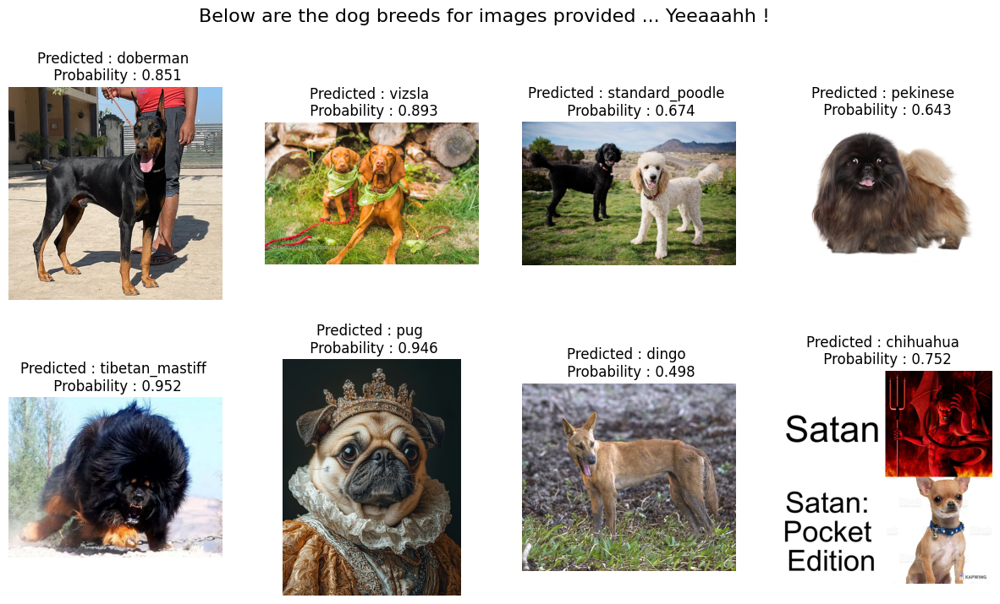

In [ ]:
fig, axes = plt.subplots(2, 4, figsize=(15, 8))
fig.suptitle("Below are the dog breeds for images provided ... Yeeaaahh !", fontsize=16)
for i, ax in enumerate(axes.flatten()):
  ax.imshow(plt.imread(custom_image_paths[i]))
  ax.axis("off")
  ax.set_title(f"Predicted : {custom_list[i]} \n Probability : {custom_prob[i]:.3f}")

In [ ]:
%%time
import tensorflow as tf
import numpy as np
import shap

image_arrays = []
for img_path in custom_image_paths:
    img = tf.keras.utils.load_img(img_path, target_size=(224, 224))
    img_array = tf.keras.utils.img_to_array(img)
    img_array = np.clip(img_array, 0, 255).astype(np.uint8)
    image_arrays.append(img_array)

X_batch = np.array(image_arrays)

def model_fn(X):
    X_preprocessed = tf.keras.applications.mobilenet_v2.preprocess_input(X.copy())
    return loaded_model(X_preprocessed)

masker = shap.maskers.Image("inpaint_telea", X_batch[0].shape)
explainer = shap.Explainer(model_fn, masker)

shap_values = explainer(X_batch,
                        max_evals=500,
                        batch_size=50,
                        outputs=shap.Explanation.argsort.flip[:4])

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  12%|█▎        | 1/8 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  38%|███▊      | 3/8 [01:56<02:14, 26.99s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  50%|█████     | 4/8 [02:51<02:33, 38.43s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  62%|██████▎   | 5/8 [03:46<02:13, 44.60s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  75%|███████▌  | 6/8 [04:40<01:36, 48.14s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer:  88%|████████▊ | 7/8 [05:33<00:49, 49.74s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 100%|██████████| 8/8 [06:26<00:00, 50.58s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 9it [07:22, 55.32s/it]

CPU times: user 9min 35s, sys: 14.2 s, total: 9min 49s
Wall time: 7min 34s


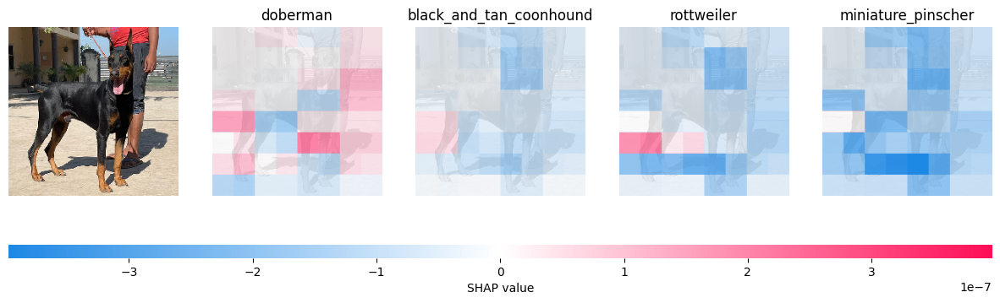

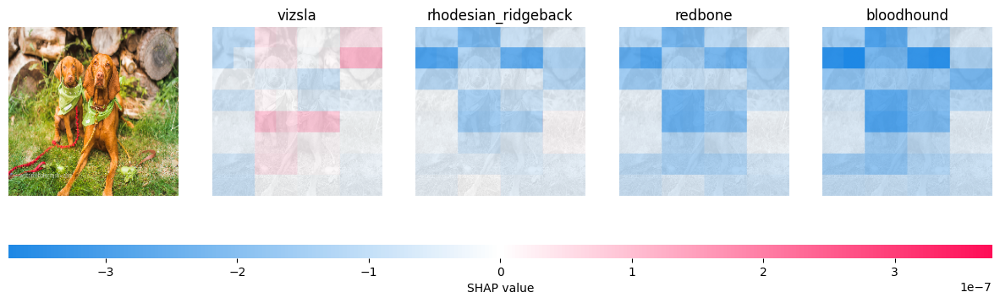

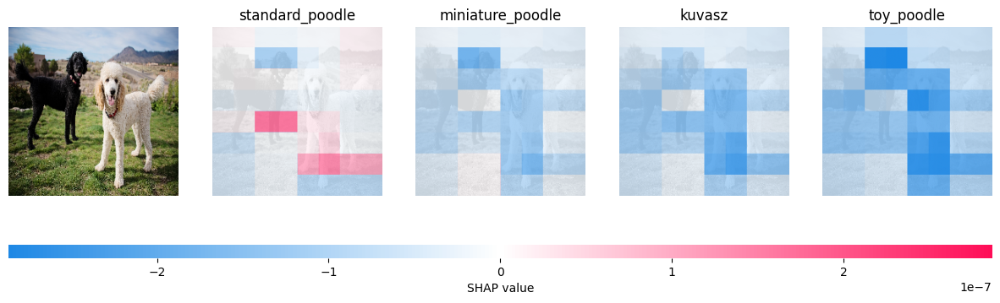

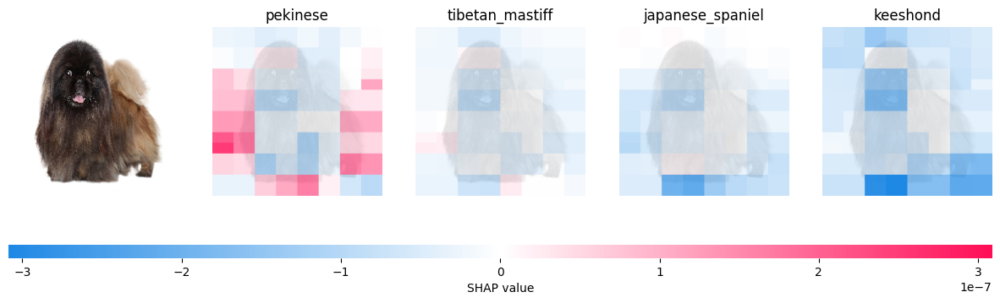

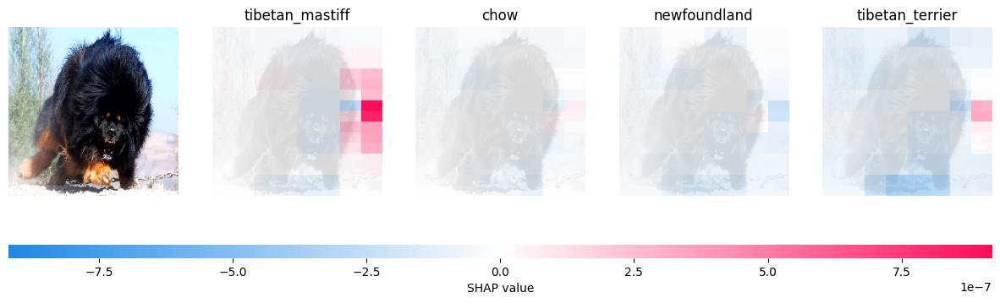

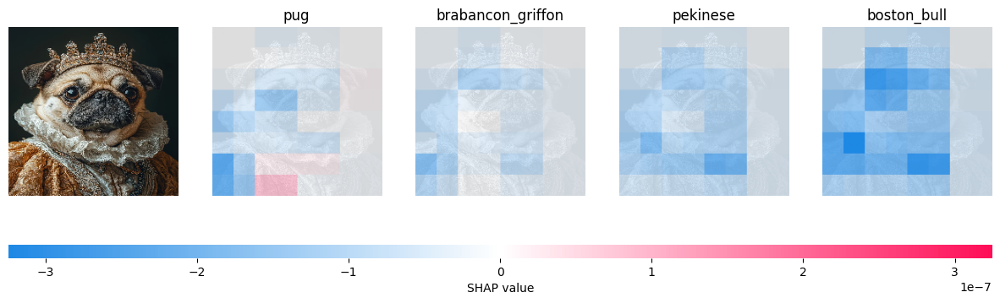

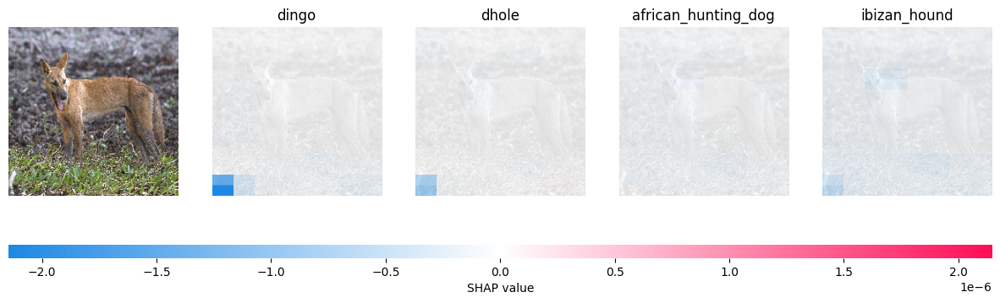

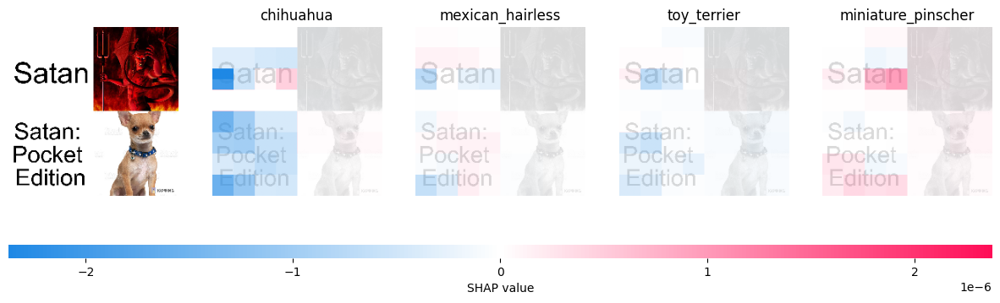

In [ ]:
shap_lists = [shap_list1, shap_list2, shap_list3, shap_list4,
              shap_list5, shap_list6, shap_list7, shap_list8]

for i in range(8):
    shap.image_plot(shap_values[i], labels=shap_lists[i])